In [1]:
import gc, torch
gc.collect()
torch.cuda.empty_cache()
print("GPU cache cleared.")

GPU cache cleared.


### __Necessary Installation__

In [2]:
import sys
!{sys.executable} -m pip install --upgrade \
  accelerate==0.31.0 \
  diffusers==0.30.0 \
  transformers==4.42.0 \
  peft==0.10.0 \
  huggingface_hub==0.25.2 --quiet

### __Required Imports__

In [3]:
import random
import matplotlib.pyplot as plt
import os, torch, json, numpy as np
from tqdm import tqdm
import textwrap
from PIL import Image
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from transformers import CLIPTokenizer, CLIPTextModel
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler, StableDiffusionPipeline
from peft import LoraConfig
from torch.utils.data.dataloader import default_collate

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Running on:", device)

/opt/conda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Running on: cuda


### __Loading CUSTOM ANIMATED dataset__

In [4]:
image_dir = "./animated_dataset/images"
metadata_path = "./animated_dataset/metadata/metadata.jsonl"

In [5]:
metadata = []
with open(metadata_path, "r") as f:
    for line in f:
        metadata.append(json.loads(line))

In [6]:
metadata = [m for m in metadata if os.path.exists(os.path.join(image_dir, m["file_name"]))]
print(f"Loaded {len(metadata)} valid samples.")

Loaded 539 valid samples.


#### Preview of sample images with caption

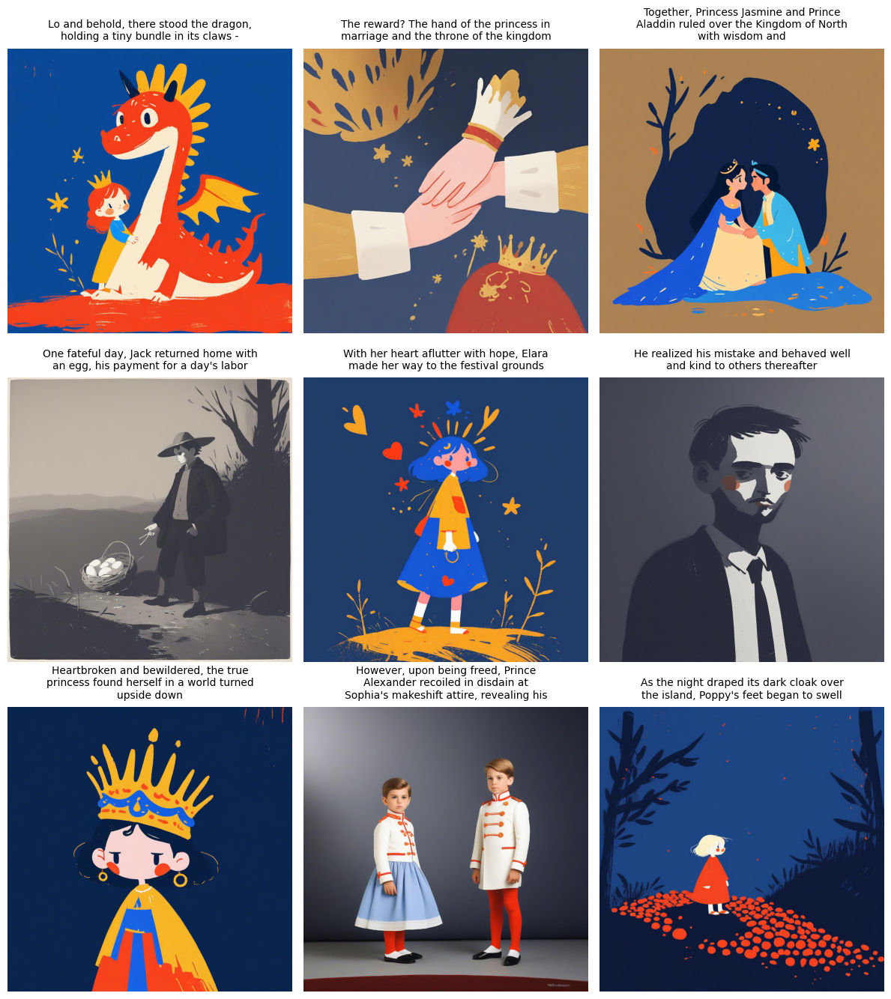

In [9]:
n = 9
samples = random.sample(metadata, n)

rows = cols = int(n ** 0.5)
plt.figure(figsize=(4 * cols, 4.5 * rows))

for i, sample in enumerate(samples):
    img_path = os.path.join(image_dir, sample["file_name"])
    caption = sample.get("additional_files", "No caption")
    
    img = Image.open(img_path).convert("RGB")

    wrapped_caption = "\n".join(textwrap.wrap(caption, width=40))

    # Plot image
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(wrapped_caption, fontsize=10, pad=10, wrap=True)

plt.tight_layout()
plt.show()

### __Data Preperation and Pre-processing__

In [15]:
class AnimatedDataset(Dataset):
    def __init__(self, img_dir, metadata, tokenizer, resolution=512):
        self.img_dir = img_dir
        self.metadata = metadata
        self.tokenizer = tokenizer
        self.transform = transforms.Compose([
            transforms.Resize((resolution, resolution)),
            transforms.RandomHorizontalFlip(p=0.2),
            transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5])
        ])

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        row = self.metadata[idx]
        img_path = os.path.join(self.img_dir, row["file_name"])
        prompt = row.get("additional_files", "anime illustration")

        try:
            image = Image.open(img_path).convert("RGB")
        except (FileNotFoundError, UnidentifiedImageError):
            # Skip missing/corrupt images by replacing with a random valid one
            new_idx = random.randint(0, len(self.metadata) - 1)
            return self.__getitem__(new_idx)

        image = self.transform(image)
        text_inputs = self.tokenizer(
            prompt,
            padding="max_length",
            truncation=True,
            max_length=77,
            return_tensors="pt"
        )
        return {"pixel_values": image, "input_ids": text_inputs["input_ids"].squeeze()}

def collate_skip_none(batch):
    batch = [b for b in batch if b is not None]
    if len(batch) == 0: return None
    return torch.utils.data.default_collate(batch)

### __Loading components of base model__

In [8]:
model_name = "runwayml/stable-diffusion-v1-5"
tokenizer = CLIPTokenizer.from_pretrained(model_name, subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(model_name, subfolder="text_encoder")
vae = AutoencoderKL.from_pretrained(model_name, subfolder="vae")
unet = UNet2DConditionModel.from_pretrained(model_name, subfolder="unet")
scheduler = DDPMScheduler.from_pretrained(model_name, subfolder="scheduler")

In [10]:
vae.to(device);
unet.to(device);
text_encoder.to(device)

CLIPTextModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e

### __Dataloaders__

In [20]:
dataset = AnimatedDataset(image_dir, metadata, tokenizer)
train_size = int(0.9 * len(dataset))
val_size = len(dataset) - train_size
train_ds, val_ds = random_split(dataset, [train_size, val_size])

In [23]:
train_dl = DataLoader(train_ds, batch_size=2, shuffle=True, 
                      num_workers=0, collate_fn=collate_skip_none)
val_dl = DataLoader(val_ds, batch_size=2, shuffle=False, 
                    num_workers=0, collate_fn=collate_skip_none)

### __Fine Tuning LoRA__

In [13]:
lora_cfg = LoraConfig(r=4, lora_alpha=4, target_modules=["to_k","to_q","to_v","to_out.0"])

if not hasattr(unet, "peft_config") or "default" not in getattr(unet, "peft_config", {}):
    unet.add_adapter(lora_cfg)
else:
    print("LoRA already attached — skipping re-add.")

optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, unet.parameters()), lr=5e-5)

### __Training Loop__

In [24]:
from PIL import UnidentifiedImageError

EPOCHS = 60
accum_steps = 2
patience, best_val, wait = 10, float("inf"), 0
train_losses, val_losses = [], []

for epoch in range(EPOCHS):
    unet.train()
    train_loss = 0.0
    loop = tqdm(train_dl, desc=f"Epoch {epoch+1}/{EPOCHS}")
    optimizer.zero_grad()
    for step, batch in enumerate(loop):
        if batch is None: continue
        imgs = batch["pixel_values"].to(device)
        ids = batch["input_ids"].to(device)

        with torch.no_grad():
            latents = vae.encode(imgs).latent_dist.sample() * 0.18215
        noise = torch.randn_like(latents)
        t = torch.randint(0, scheduler.config.num_train_timesteps, (latents.shape[0],), device=device)
        noisy_latents = scheduler.add_noise(latents, noise, t)
        enc_states = text_encoder(ids)[0]
        noise_pred = unet(noisy_latents, t, enc_states).sample
        loss = torch.nn.functional.mse_loss(noise_pred, noise) / accum_steps
        loss.backward()
        train_loss += loss.item() * accum_steps

        if (step + 1) % accum_steps == 0:
            optimizer.step()
            optimizer.zero_grad()

        loop.set_postfix(loss=f"{loss.item()*accum_steps:.4f}")

    # Validation
    unet.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch in val_dl:
            if batch is None: continue
            imgs = batch["pixel_values"].to(device)
            ids = batch["input_ids"].to(device)
            latents = vae.encode(imgs).latent_dist.sample() * 0.18215
            noise = torch.randn_like(latents)
            t = torch.randint(0, scheduler.config.num_train_timesteps, (latents.shape[0],), device=device)
            noisy_latents = scheduler.add_noise(latents, noise, t)
            enc_states = text_encoder(ids)[0]
            noise_pred = unet(noisy_latents, t, enc_states).sample
            val_loss += torch.nn.functional.mse_loss(noise_pred, noise).item()

    avg_train, avg_val = train_loss / len(train_dl), val_loss / len(val_dl)
    train_losses.append(avg_train)
    val_losses.append(avg_val)
    print(f"Epoch {epoch+1}: train={avg_train:.4f}, val={avg_val:.4f}")

    if avg_val < best_val:
        best_val, wait = avg_val, 0
        torch.save(unet.state_dict(), "part2.pth")
    else:
        wait += 1
        if wait >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

Epoch 1/60: 100%|██████████| 243/243 [01:12<00:00,  3.37it/s, loss=0.0929]


Epoch 1: train=0.0993, val=0.0945


Epoch 2/60: 100%|██████████| 243/243 [01:11<00:00,  3.38it/s, loss=0.0360]


Epoch 2: train=0.0973, val=0.0699


Epoch 3/60: 100%|██████████| 243/243 [01:32<00:00,  2.63it/s, loss=0.0089]


Epoch 3: train=0.0889, val=0.0923


Epoch 4/60: 100%|██████████| 243/243 [01:11<00:00,  3.38it/s, loss=0.0141]


Epoch 4: train=0.0915, val=0.0717


Epoch 5/60: 100%|██████████| 243/243 [01:11<00:00,  3.38it/s, loss=0.0460]


Epoch 5: train=0.0936, val=0.0944


Epoch 6/60: 100%|██████████| 243/243 [01:12<00:00,  3.37it/s, loss=0.0397]


Epoch 6: train=0.0871, val=0.1046


Epoch 7/60: 100%|██████████| 243/243 [01:11<00:00,  3.38it/s, loss=0.2840]


Epoch 7: train=0.0987, val=0.0965


Epoch 8/60: 100%|██████████| 243/243 [01:12<00:00,  3.37it/s, loss=0.0580]


Epoch 8: train=0.0872, val=0.0862


Epoch 9/60: 100%|██████████| 243/243 [01:11<00:00,  3.40it/s, loss=0.0478]


Epoch 9: train=0.0927, val=0.1083


Epoch 10/60: 100%|██████████| 243/243 [01:12<00:00,  3.35it/s, loss=0.3094]


Epoch 10: train=0.1031, val=0.1140


Epoch 11/60: 100%|██████████| 243/243 [01:12<00:00,  3.36it/s, loss=0.0456]


Epoch 11: train=0.0916, val=0.1083


Epoch 12/60: 100%|██████████| 243/243 [01:12<00:00,  3.36it/s, loss=0.0114]


Epoch 12: train=0.0953, val=0.0638


Epoch 13/60: 100%|██████████| 243/243 [01:11<00:00,  3.39it/s, loss=0.0201]


Epoch 13: train=0.1036, val=0.0943


Epoch 14/60: 100%|██████████| 243/243 [01:11<00:00,  3.41it/s, loss=0.1063]


Epoch 14: train=0.0911, val=0.0886


Epoch 15/60: 100%|██████████| 243/243 [01:11<00:00,  3.41it/s, loss=0.0507]


Epoch 15: train=0.0913, val=0.0950


Epoch 16/60: 100%|██████████| 243/243 [01:10<00:00,  3.44it/s, loss=0.0465]


Epoch 16: train=0.0847, val=0.0726


Epoch 17/60: 100%|██████████| 243/243 [01:10<00:00,  3.44it/s, loss=0.0057]


Epoch 17: train=0.0994, val=0.1186


Epoch 18/60: 100%|██████████| 243/243 [01:10<00:00,  3.42it/s, loss=0.1205]


Epoch 18: train=0.0984, val=0.0929


Epoch 19/60: 100%|██████████| 243/243 [01:11<00:00,  3.41it/s, loss=0.0394]


Epoch 19: train=0.1012, val=0.0852


Epoch 20/60: 100%|██████████| 243/243 [01:10<00:00,  3.42it/s, loss=0.2222]


Epoch 20: train=0.0843, val=0.0696


Epoch 21/60: 100%|██████████| 243/243 [01:11<00:00,  3.42it/s, loss=0.1760]


Epoch 21: train=0.0809, val=0.0749


Epoch 22/60: 100%|██████████| 243/243 [01:10<00:00,  3.42it/s, loss=0.0099]


Epoch 22: train=0.0987, val=0.0742
Early stopping at epoch 22


### __Learning Curve__

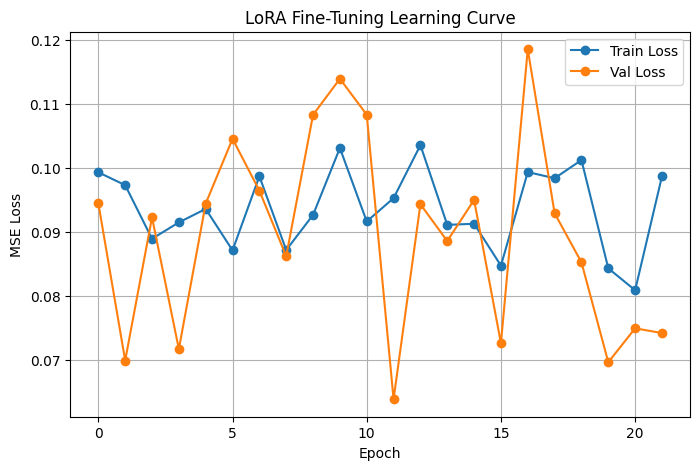

In [25]:
plt.figure(figsize=(8,5))
plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Val Loss", marker="o")
plt.title("LoRA Fine-Tuning Learning Curve")
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.legend()
plt.grid(True)
plt.show()

### __Image Generation__

In [26]:
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained(model_name, torch_dtype=torch.float16)
pipe.unet.load_state_dict(torch.load("part2.pth", map_location=device), strict=False)
pipe.to(device)

Loading pipeline components...: 100%|██████████| 7/7 [00:03<00:00,  2.05it/s]


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.30.0",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

### __Custom Prompts__

In [50]:
prompts = [
    "a girl in a red dress with trees in background, soft lighting",
    "a knight in shining armor holding a sword in forest, cinematic lighting",
    "a little fairy in blue starry sky holding magic dust, dreamy lighting",
    "a wizard casting fire magic in a dark forest, glowing light",
    "a anime princess in a crystal palace, detailed crown, beautiful gown",
    "a cute white fox under a snowy night sky, dreamy atmosphere",
]

In [45]:
for i, p in enumerate(prompts):
    img = pipe(p, num_inference_steps=25, guidance_scale=7.5).images[0]
    img.save(f"improved_gen_{i}.png")
    print(f"Saved: improved_gen_{i}.png")

100%|██████████| 25/25 [00:00<00:00, 27.39it/s]


Saved: improved_gen_0.png


100%|██████████| 25/25 [00:00<00:00, 36.06it/s]


Saved: improved_gen_1.png


100%|██████████| 25/25 [00:00<00:00, 35.41it/s]


Saved: improved_gen_2.png


100%|██████████| 25/25 [00:00<00:00, 35.98it/s]


Saved: improved_gen_3.png


100%|██████████| 25/25 [00:00<00:00, 36.39it/s]


Saved: improved_gen_4.png


100%|██████████| 25/25 [00:00<00:00, 36.56it/s]


Saved: improved_gen_5.png


In [47]:
# Folder containing generated images
gen_dir = "./"
gen_images = sorted([os.path.join(gen_dir, f) for f in os.listdir(gen_dir)
                     if f.endswith(".png") and f.startswith("improved_gen_")])

In [48]:
# Preprocess images for metrics
to_tensor = transforms.ToTensor()
img_tensors = torch.stack([to_tensor(Image.open(p).convert("RGB")) for p in gen_images])

# For Inception Score: expect uint8 images in [0, 255]
img_uint8 = (img_tensors * 255).to(torch.uint8)

### __Evaluation Metrics__

#### __1. Human Observed__

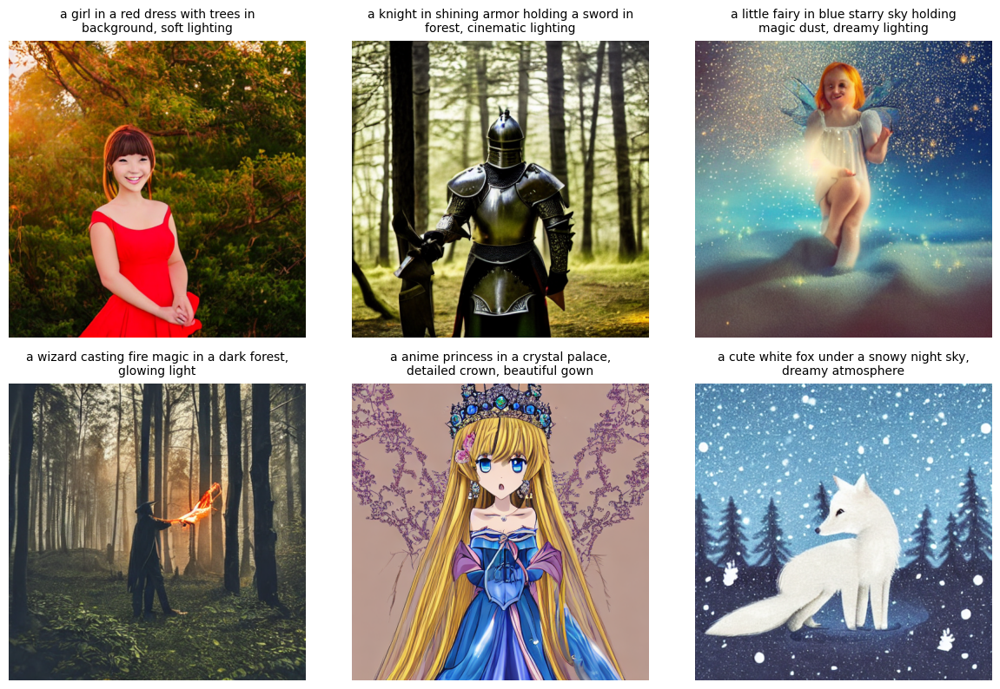

In [51]:
rows, cols = 3, 3
plt.figure(figsize=(12, 12))

for i, img_path in enumerate(gen_images[:rows*cols]):
    img = Image.open(img_path).convert("RGB")
    caption = prompts[i] if i < len(prompts) else os.path.basename(img_path)
    wrapped_caption = "\n".join(textwrap.wrap(caption, width=45))

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(wrapped_caption, fontsize=10, pad=8)

plt.tight_layout()
plt.show()

#### __2. Insception Score__

In [52]:
from torchmetrics.image.inception import InceptionScore

is_metric = InceptionScore()
is_val = is_metric(img_uint8)
print(f"Inception Score (IS): {is_val[0]:.3f} ± {is_val[1]:.3f}")

Inception Score (IS): 1.000 ± 0.000


#### __3. CLIP Similarity Score__

In [53]:
from torchmetrics.multimodal import CLIPScore

clip_metric = CLIPScore(model_name_or_path="openai/clip-vit-base-patch32")
clip_val = clip_metric(list(img_tensors), prompts[:len(img_tensors)])

print(f"CLIP Similarity Score: {clip_val:.3f}")

CLIP Similarity Score: 20.141


In [54]:
# Saving metrics to file
with open("evaluation_results.txt", "w") as f:
    f.write(f"Inception Score (IS): {is_val[0]:.3f} ± {is_val[1]:.3f}\n")
    f.write(f"CLIP Similarity Score: {clip_val:.3f}\n")

print("Evaluation is complete and results are saved to evaluation_results.txt")

Evaluation is complete and results are saved to evaluation_results.txt


#### __4. Batch Generation for Evaluation__

In [55]:
prompts = [
    "an illustrated girl in an orange dress, whimsical fairytale style",
    "young prince wearing a crown, standing beside a white horse, soft storybook lighting",
    "violinist playing under glowing lanterns, warm tones, painterly illustration",
    "animated characters dancing in the moonlight, romantic atmosphere, watercolor background",
    "a girl posing with peace gesture in cherry blossom field",
    "old castle on a hill at sunset, magical glow, fairytale illustration style",
    "anime child holding lantern in a misty forest",
    "group of friends walking through autumn leaves, warm color palette",
    "queen sitting on her throne with golden accents, hand-painted look",
    "anime dragon flying above mountains, animated feel",
]

In [57]:
# Generate 100 images (10 prompts × 10 seeds)
os.makedirs("generated_batch", exist_ok=True)

count = 0
for prompt in prompts:
    for seed in range(10):
        generator = torch.Generator(device=device).manual_seed(seed)
        img = pipe(prompt, num_inference_steps=25, guidance_scale=8.0, generator=generator).images[0]
        img.save(f"generated_batch/{count:03d}.png")
        count += 1
        if count % 10 == 0:
            print(f"Generated {count}/100 images")

print("All 100 images generated and saved to ./generated_batch/")

100%|██████████| 25/25 [00:00<00:00, 36.19it/s]


Generated 10/100 images


100%|██████████| 25/25 [00:00<00:00, 36.50it/s]


Generated 20/100 images


100%|██████████| 25/25 [00:00<00:00, 35.70it/s]


Generated 30/100 images


100%|██████████| 25/25 [00:00<00:00, 35.48it/s]


Generated 40/100 images


100%|██████████| 25/25 [00:00<00:00, 36.25it/s]


Generated 50/100 images


100%|██████████| 25/25 [00:00<00:00, 36.26it/s]


Generated 60/100 images


100%|██████████| 25/25 [00:00<00:00, 36.33it/s]


Generated 70/100 images


100%|██████████| 25/25 [00:00<00:00, 36.20it/s]


Generated 80/100 images


100%|██████████| 25/25 [00:00<00:00, 36.40it/s]


Generated 90/100 images


100%|██████████| 25/25 [00:00<00:00, 36.08it/s]


Generated 100/100 images
All 100 images generated and saved to ./generated_batch/


In [64]:
# Gather generated images
img_paths = [os.path.join("generated_batch", f) for f in os.listdir("generated_batch") if f.endswith(".png")]
to_tensor = transforms.ToTensor()
img_tensors = torch.stack([to_tensor(Image.open(p).convert("RGB")) for p in img_paths])

# Convert to uint8 for IS
img_uint8 = (img_tensors * 255).to(torch.uint8)

gen_batch_dir = "./generated_batch"
gen_batch_images = sorted([os.path.join(gen_batch_dir, f) for f in os.listdir(gen_batch_dir) if f.endswith(".png")])

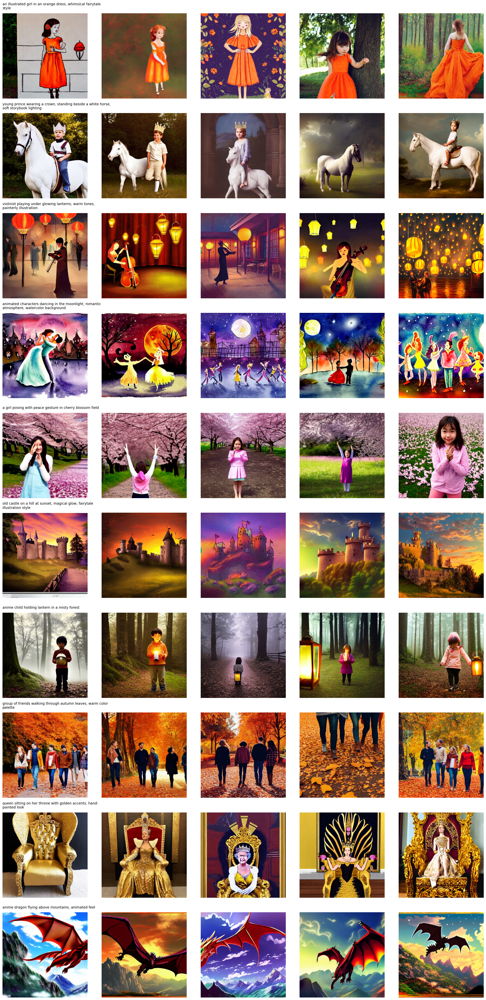

In [71]:
samples_per_prompt = 10
display_per_prompt = 5  

rows, cols = len(prompts), display_per_prompt
plt.figure(figsize=(cols * 4, rows * 4))

for row_idx, prompt in enumerate(prompts):
    start_idx = row_idx * samples_per_prompt
    end_idx = start_idx + display_per_prompt  # first 5 from that block

    for col_idx, idx in enumerate(range(start_idx, end_idx)):
        if idx >= len(gen_batch_images):
            continue
        img_path = gen_batch_images[idx]
        img = Image.open(img_path).convert("RGB")

        plt.subplot(rows, cols, row_idx * cols + col_idx + 1)
        plt.imshow(img)
        plt.axis("off")

        # add prompt title on leftmost column
        if col_idx == 0:
            caption = "\n".join(textwrap.wrap(prompt, width=60))
            plt.title(caption, fontsize=10, pad=12, loc='left')

plt.tight_layout()
plt.show()

In [72]:
# Compute metrics
is_metric = InceptionScore()
clip_metric = CLIPScore(model_name_or_path="openai/clip-vit-base-patch32")

is_val = is_metric(img_uint8)
clip_val = clip_metric(list(img_tensors), [prompts[i % len(prompts)] for i in range(len(img_tensors))])

print(f"\nEvaluation Results (100 samples):")
print(f"Inception Score (IS): {is_val[0]:.3f} ± {is_val[1]:.3f}")
print(f"CLIP Similarity Score: {clip_val:.3f}")

# Save metrics
with open("batch_evaluation_results.txt", "w") as f:
    f.write(f"Inception Score (IS): {is_val[0]:.3f} ± {is_val[1]:.3f}\n")
    f.write(f"CLIP Similarity Score: {clip_val:.3f}\n")

print("Metrics saved to batch_evaluation_results.txt")


Evaluation Results (100 samples):
Inception Score (IS): 3.963 ± 0.668
CLIP Similarity Score: 19.962
Metrics saved to batch_evaluation_results.txt
